By deploying or using this software you agree to comply with the [AI Hub Terms of Service]( https://aihub.cloud.google.com/u/0/aihub-tos) and the [Google APIs Terms of Service](https://developers.google.com/terms/). To the extent of a direct conflict of terms, the AI Hub Terms of Service will control.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/GoogleCloudPlatform/ai-platform-samples/blob/main/notebooks/samples/aihub/retinanet/retinanet.ipynb)

# Overview

This notebook provides an example workflow of using the [RetinaNet ML container](https://aihub.cloud.google.com/u/0/p/products%2F5ab1b26d-9d4a-44c7-8dbc-365d4d5233f3) for training an Object Detection ML model.

### Dataset

To preprocess an object detection dataset, look at this [COCO example](https://github.com/tensorflow/tpu/tree/main/models/official/retinanet#preparing-the-coco-dataset)


### Objective

The goal of this notebook is to go through a common training workflow:
- Train an ML model using the [AI Platform Training](https://cloud.google.com/ai-platform/training/docs) service
- Monitor the training job with [TensorBoard](https://www.tensorflow.org/tensorboard)
- Identify if the model was trained successfully by looking at the generated "Run Report"
- Deploy the model for serving using the [AI Platform Prediction](https://cloud.google.com/ai-platform/prediction/docs/overview) service
- Use the endpoint for online predictions

### Costs 

This tutorial uses billable components of Google Cloud Platform (GCP):

* Cloud AI Platform
* Cloud Storage

Learn about [Cloud AI Platform
pricing](https://cloud.google.com/ml-engine/docs/pricing) and [Cloud Storage
pricing](https://cloud.google.com/storage/pricing), and use the [Pricing
Calculator](https://cloud.google.com/products/calculator/)
to generate a cost estimate based on your projected usage.

### Set up your local development environment

**If you are using Colab or Vertex AI Workbench notebooks**, your environment already meets
all the requirements to run this notebook. You can skip this step.

**Otherwise**, make sure your environment meets this notebook's requirements.
You need the following:

* The Google Cloud SDK
* Git
* Python 3
* virtualenv
* Jupyter notebook running in a virtual environment with Python 3

The Google Cloud guide to [Setting up a Python development
environment](https://cloud.google.com/python/setup) and the [Jupyter
installation guide](https://jupyter.org/install) provide detailed instructions
for meeting these requirements. The following steps provide a condensed set of
instructions:

1. [Install and initialize the Cloud SDK.](https://cloud.google.com/sdk/docs/)

2. [Install Python 3.](https://cloud.google.com/python/setup#installing_python)

3. [Install
   virtualenv](https://cloud.google.com/python/setup#installing_and_using_virtualenv)
   and create a virtual environment that uses Python 3.

4. Activate that environment and run `pip install jupyter` in a shell to install
   Jupyter.

5. Run `jupyter notebook` in a shell to launch Jupyter.

6. Open this notebook in the Jupyter Notebook Dashboard.

### Set up your GCP project

**The following steps are required, regardless of your notebook environment.**

1. [Select or create a GCP project.](https://console.cloud.google.com/cloud-resource-manager). When you first create an account, you get a $300 free credit towards your compute/storage costs.

2. [Make sure that billing is enabled for your project.](https://cloud.google.com/billing/docs/how-to/modify-project)

3. [Enable the AI Platform APIs and Compute Engine APIs.](https://console.cloud.google.com/flows/enableapi?apiid=ml.googleapis.com,compute_component)

4. Enter your project ID in the cell below. Then run the  cell to make sure the
Cloud SDK uses the right project for all the commands in this notebook.

**Note**: Jupyter runs lines prefixed with `!` as shell commands, and it interpolates Python variables prefixed with `$` into these commands.

In [ ]:
PROJECT_ID = "[your-project-id]" #@param {type:"string"}
! gcloud config set project $PROJECT_ID

### Authenticate your GCP account

**If you are using Vertex AI Workbench notebooks**, your environment is already
authenticated. Skip this step.

**If you are using Colab**, run the cell below and follow the instructions
when prompted to authenticate your account via oAuth.

**Otherwise**, follow these steps:

1. In the GCP Console, go to the [**Create service account key**
   page](https://console.cloud.google.com/apis/credentials/serviceaccountkey).

2. From the **Service account** drop-down list, select **New service account**.

3. In the **Service account name** field, enter a name.

4. From the **Role** drop-down list, select
   **Machine Learning Engine > AI Platform Admin** and
   **Storage > Storage Object Admin**.

5. Click *Create*. A JSON file that contains your key downloads to your
local environment.

6. Enter the path to your service account key as the
`GOOGLE_APPLICATION_CREDENTIALS` variable in the cell below and run the cell.

In [ ]:
import sys

# If you are running this notebook in Colab, run this cell and follow the
# instructions to authenticate your GCP account. This provides access to your
# Cloud Storage bucket and lets you submit training jobs and prediction
# requests.

if 'google.colab' in sys.modules:
  from google.colab import auth as google_auth
  google_auth.authenticate_user()

# If you are running this notebook locally, replace the string below with the
# path to your service account key and run this cell to authenticate your GCP
# account.
else:
  %env GOOGLE_APPLICATION_CREDENTIALS ''

### Create a Cloud Storage bucket

**The following steps are required, regardless of your notebook environment.**

You need to have a "workspace" bucket that will hold the dataset and the output from the ML Container. Set the name of your Cloud Storage bucket below. It must be unique across all Cloud Storage buckets. 

You may also change the `REGION` variable, which is used for operations
throughout the rest of this notebook. Make sure to [choose a region where Cloud AI Platform services are available](https://cloud.google.com/ml-engine/docs/tensorflow/regions). You may not use a Multi-Regional Storage bucket for training with AI Platform.

In [ ]:
BUCKET_NAME = "[your-bucket-name]" #@param {type:"string"}
REGION = 'us-central1' #@param {type:"string"}

**Only if your bucket doesn't already exist**: Run the following cell to create your Cloud Storage bucket.

In [ ]:
! gsutil mb -l $REGION gs://$BUCKET_NAME

Finally, validate access to your Cloud Storage bucket by examining its contents:

In [ ]:
! gsutil ls -al gs://$BUCKET_NAME

### Import libraries and define constants

In [ ]:
import time
from IPython.core.display import HTML
import tensorflow as tf
import os
import requests
import base64
from googleapiclient import discovery

## Cloud training

### Accelerator and distribution support

| GPU | Multi-GPU Node | TPU | Workers | Parameter Server |
|---|---|---|---|---|
| Yes | Yes | Yes | No | No |

```
    --master-machine-type standard \
    --worker-machine-type cloud_tpu \
```

In [ ]:
output_location = os.path.join('gs://', BUCKET_NAME, 'output')

job_name = "retinanet_{}".format(time.strftime("%Y%m%d%H%M%S"))
!gcloud beta ai-platform jobs submit training $job_name \
    --master-image-uri gcr.io/aihub-c2t-containers/kfp-components/oob_algorithm/retinanet:latest \
    --region $REGION \
    --scale-tier CUSTOM \
    --master-machine-type standard \
    --worker-machine-type cloud_tpu \
    --worker-count 1 \
    --tpu-tf-version 1.14 \
    -- \
    --output-location $output_location \
    --training-data {BUCKET_NAME}/coco_data/train-*.tfrecord \
    --validation-data {BUCKET_NAME}/coco_data/val-*.tfrecord \
    --validation-json-file {BUCKET_NAME}/coco_data/instances_val2017.json \
    --number-of-classes 80 \
    --use-half-precision True \
    --training-epochs 50 \
    --use-pretrained True \
    --batch-size 128

## Monitor the training with TensorBoard

In [ ]:
try:
  %load_ext tensorboard
  %tensorboard --logdir {output_location}
except:
  !tensorboard --logdir {output_location}

## Inspect the Run Report

Note that this model needs more training.


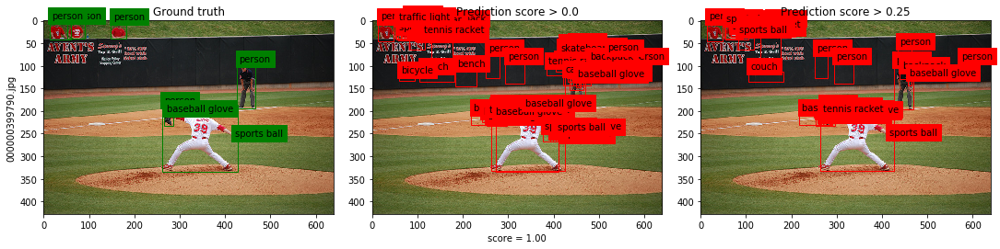
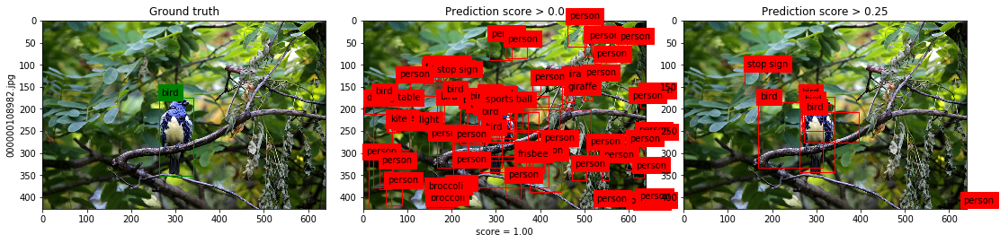
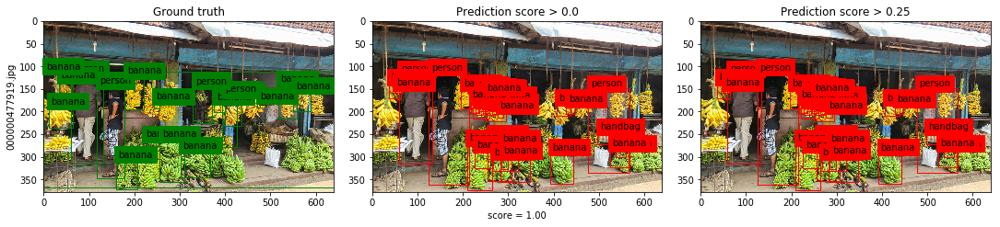
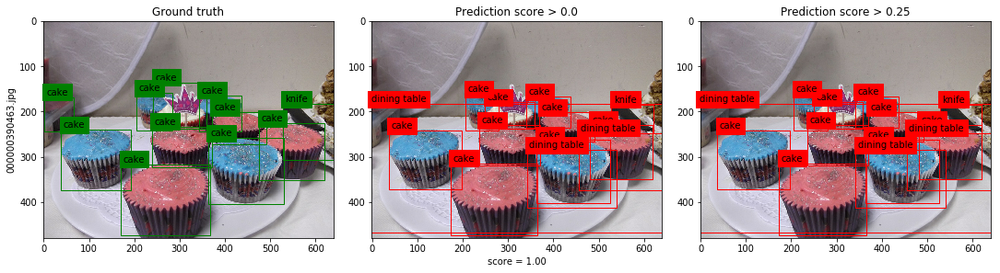
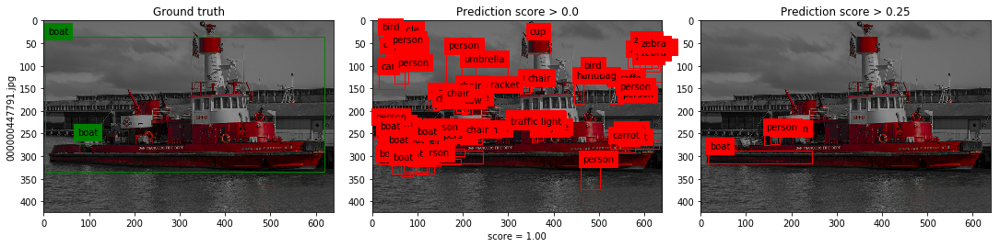
...
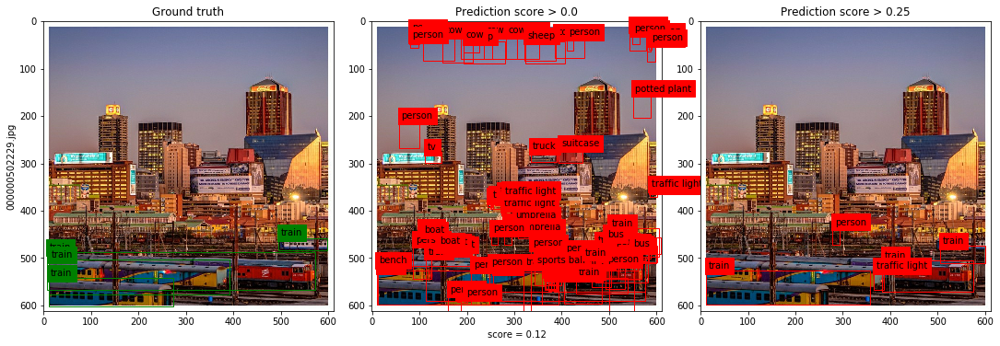
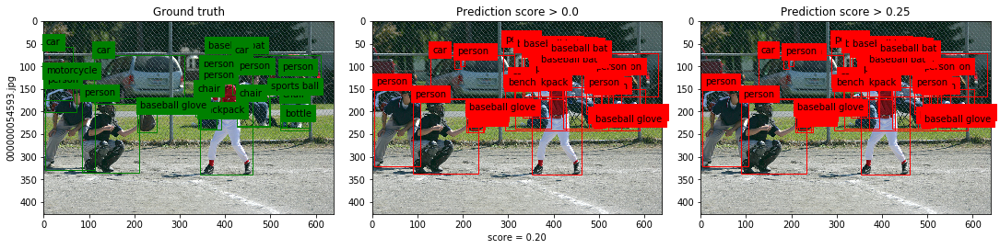
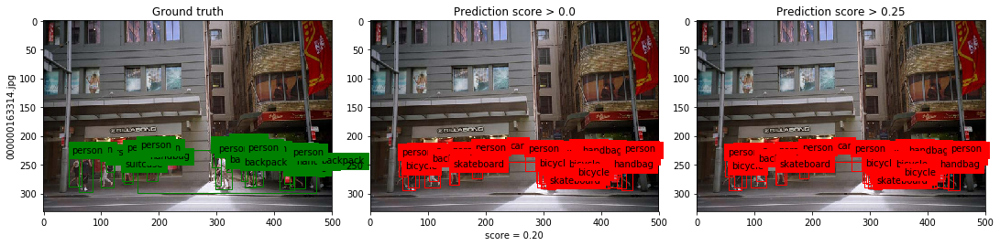
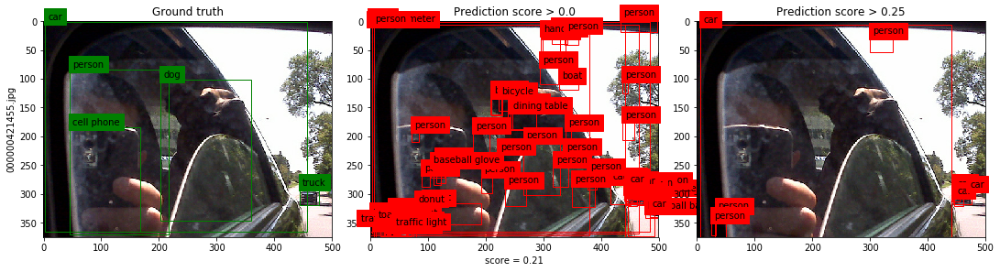
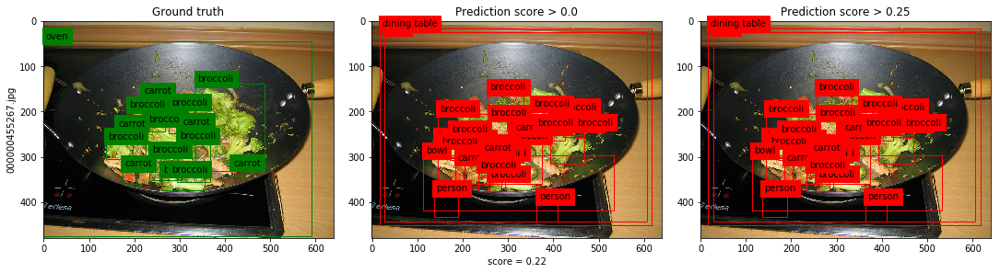

In [29]:
if not tf.io.gfile.exists(os.path.join(output_location, 'report.html')):
  raise RuntimeError('The file report.html was not found. Did the training job finish?')

with tf.io.gfile.GFile(os.path.join(output_location, 'report.html')) as f:
  display(HTML(f.read()))

- https://cloud.google.com/sdk/gcloud/reference/beta/ai-platform/versions/create

## Deployment parameters

In [ ]:
#@markdown ---
model = 'retinanet' #@param {type:"string"}
version = 'v1' #@param {type:"string"}
#@markdown ---

In [ ]:
# the exact location of the model is in model_uri.txt
with tf.io.gfile.GFile(os.path.join(output_location, 'model_uri.txt')) as f:
  model_uri = f.read()

# create a model
!gcloud ai-platform models create $model --regions $REGION

# create a version
!gcloud beta ai-platform versions create $version \
  --model $model \
  --origin $model_uri \
  --runtime-version 1.15 \
  --project $PROJECT_ID

### Get one image for test prediction

![](https://static01.nyt.com/images/2018/12/22/us/00carattack1-promo/00carattack1-promo-superJumbo-v2.jpg)

#### Download and encode one image

In [41]:
# 
!wget --output-document /tmp/image.jpeg \
  https://static01.nyt.com/images/2018/12/22/us/00carattack1-promo/00carattack1-promo-superJumbo-v2.jpg

# read the image, decode, resize and base 64 encode it
with tf.Session() as sess:
  encoded_image = sess.run(tf.io.read_file('/tmp/image.jpeg'))

encoded_image = base64.b64encode(encoded_image).decode()
encoded_image[:200]

--2020-02-11 10:37:06--  https://static01.nyt.com/images/2018/12/22/us/00carattack1-promo/00carattack1-promo-superJumbo-v2.jpg
Resolving static01.nyt.com (static01.nyt.com)... 151.101.189.164
Connecting to static01.nyt.com (static01.nyt.com)|151.101.189.164|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 463251 (452K) [image/jpeg]
Saving to: ‘/tmp/image.jpeg’

/tmp/image.jpeg     100%[===================>] 452.39K   978KB/s    in 0.5s    

2020-02-11 10:37:07 (978 KB/s) - ‘/tmp/image.jpeg’ saved [463251/463251]



'/9j/4AAQSkZJRgABAQEBLAEsAAD/4gxYSUNDX1BST0ZJTEUAAQEAAAxITGlubwIQAABtbnRyUkdCIFhZWiAHzgACAAkABgAxAABhY3NwTVNGVAAAAABJRUMgc1JHQgAAAAAAAAAAAAAAAAAA9tYAAQAAAADTLUhQICAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA'

## Make online prediction

In [49]:
service = discovery.build('ml', 'v1')
name = 'projects/{project}/models/{model}/versions/{version}'.format(project=PROJECT_ID,
                                                                    model=model,
                                                                    version=version)
body = {'instances': {'input': {'b64': encoded_image}}}

response = service.projects().predict(name=name, body=body).execute()
if 'error' in response:
    raise RuntimeError(response['error'])
    
response['predictions'][0]

/Users/evo/Library/Python/3.7/lib/python/site-packages/google/auth/_default.py:66: UserWarning:

Your application has authenticated using end user credentials from Google Cloud SDK. We recommend that most server applications use service accounts instead. If your application continues to use end user credentials from Cloud SDK, you might receive a "quota exceeded" or "API not enabled" error. For more information about service accounts, see https://cloud.google.com/docs/authentication/



{'image_info': [426.0, 640.0, 3.200000047683716, 1365.0, 2048.0],
 'detection_classes': [3.0,
  10.0,
  10.0,
  10.0,
  1.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  1.0,
  10.0,
  10.0,
  3.0,
  10.0,
  10.0,
  1.0,
  10.0,
  10.0,
  3.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  14.0,
  10.0,
  13.0,
  3.0,
  10.0,
  3.0,
  8.0,
  3.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  10.0,
  1.0,
  1.0,
  10.0,
  3.0,
  10.0,
  10.0,
  10.0,
  10.0,
  3.0,
  10.0,
  3.0,
  10.0,
  28.0,
  10.0,
  1.0,
  14.0,
  10.0,
  10.0,
  3.0,
  3.0,
  10.0,
  10.0,
  49.0,
  1.0,
  10.0,
  10.0,
  1.0,
  28.0,
  1.0,
  3.0,
  10.0,
  1.0,
  10.0,
  10.0,
  10.0,
  3.0,
  13.0,
  13.0,
  3.0,
  1.0,
  14.0,
  19.0,
  10.0,
  1.0,
  10.0,
  10.0,
  10.0,
  1.0,
  10.0],
 'detection_boxes': [[188.1590118408203,
   374.0584716796875,
   247.447021484375,
   534.239990234375],
  [16.917407989501953,
   280.8747